# RNA velocity analysis

This walk-thru is based heavily on https://scvelo.readthedocs.io/VelocityBasics/


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy as sp
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# NB these new packages
import scvelo as scv
import cellrank as cr

In [2]:
scv.settings.presenter_view = True
scv.set_figure_params('scvelo') 

Describe the first data set...

In [3]:
adata = scv.datasets.pancreas()
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

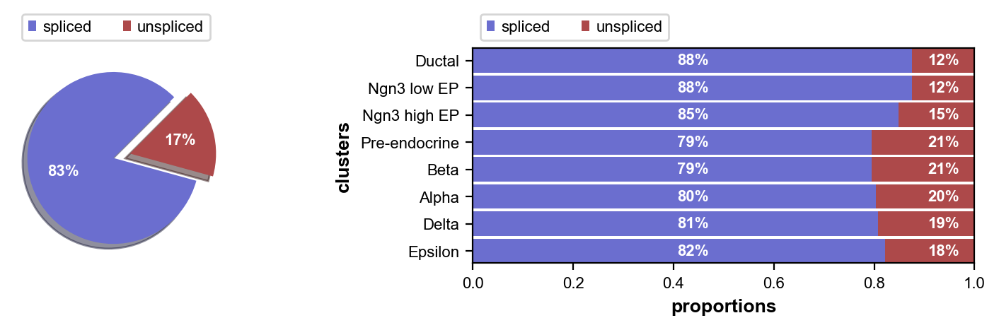

In [4]:
scv.pl.proportions(adata)

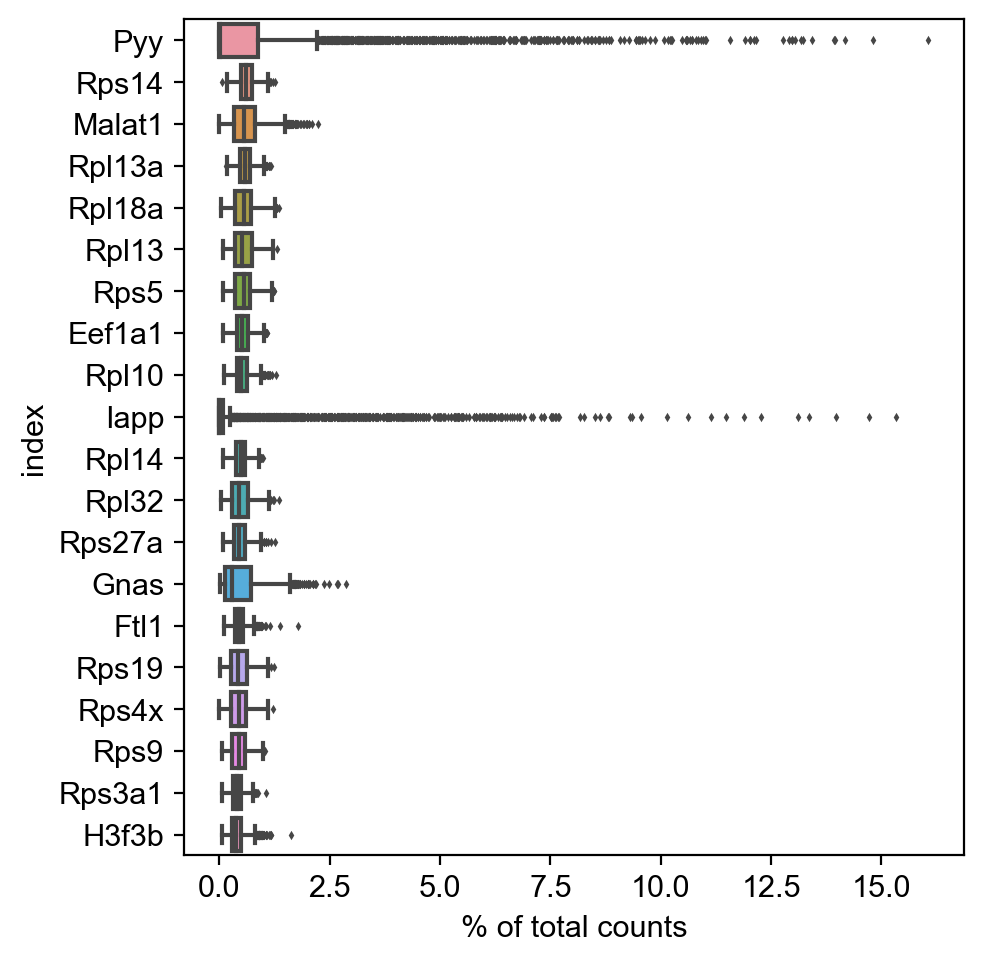

In [5]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [6]:
adata.obs

,clusters_coarse,clusters,S_score,G2M_score
index,,,,
AAACCTGAGAGGGATA,Pre-endocrine,Pre-endocrine,-0.224902,-0.252071
AAACCTGAGCCTTGAT,Ductal,Ductal,-0.014707,-0.232610
AAACCTGAGGCAATTA,Endocrine,Alpha,-0.171255,-0.286834
AAACCTGCATCATCCC,Ductal,Ductal,0.599244,0.191243
AAACCTGGTAAGTGGC,Ngn3 high EP,Ngn3 high EP,-0.179981,-0.126030
...,...,...,...,...
TTTGTCAAGTGACATA,Pre-endocrine,Pre-endocrine,-0.235896,-0.266101
TTTGTCAAGTGTGGCA,Ngn3 high EP,Ngn3 high EP,0.279374,-0.204047
TTTGTCAGTTGTTTGG,Ductal,Ductal,-0.045692,-0.208907


In [7]:
adata.var

,highly_variable_genes
index,
Xkr4,False
Gm37381,NaN
Rp1,NaN
Rp1-1,NaN
Sox17,NaN
...,...
Gm28672,NaN
Gm28670,NaN
Gm29504,NaN


In [8]:
adata.var['mt']= adata.var_names.str.startswith(("mt-"))
print(sum(adata.var['mt']))

13


In [9]:
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
print(sum(adata.var['ribo']))

113


In [10]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)

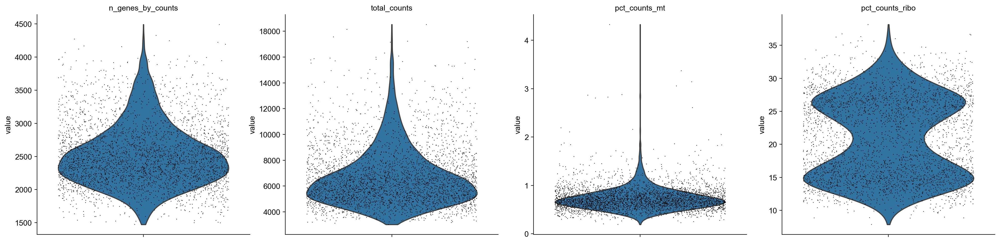

In [11]:
axs = sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)

In [12]:
print("Number of genes: ",adata.n_vars)
gThresh = 5

sc.pp.filter_genes(adata, min_cells=gThresh)
print("Number of genes: ",adata.n_vars)

Number of genes:  27998
Number of genes:  14915


In [13]:
mito_genes = adata.var_names.str.startswith('mt-')
ribo_genes = adata.var_names.str.startswith(("Rpl","Rps"))
malat_gene = adata.var_names.str.startswith("Malat1")

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, malat_gene)

keep = np.invert(remove)
adata = adata[:,keep].copy()
print("Number of genes: ",adata.n_vars)

Number of genes:  14800


#### Spliced/unspliced normalization

In [14]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.log1p(adata)

Filtered out 7692 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


In [15]:
adata

AnnData object with n_obs × n_vars = 3696 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'highly_variable_genes', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

#### Talk about embedding like UMAP

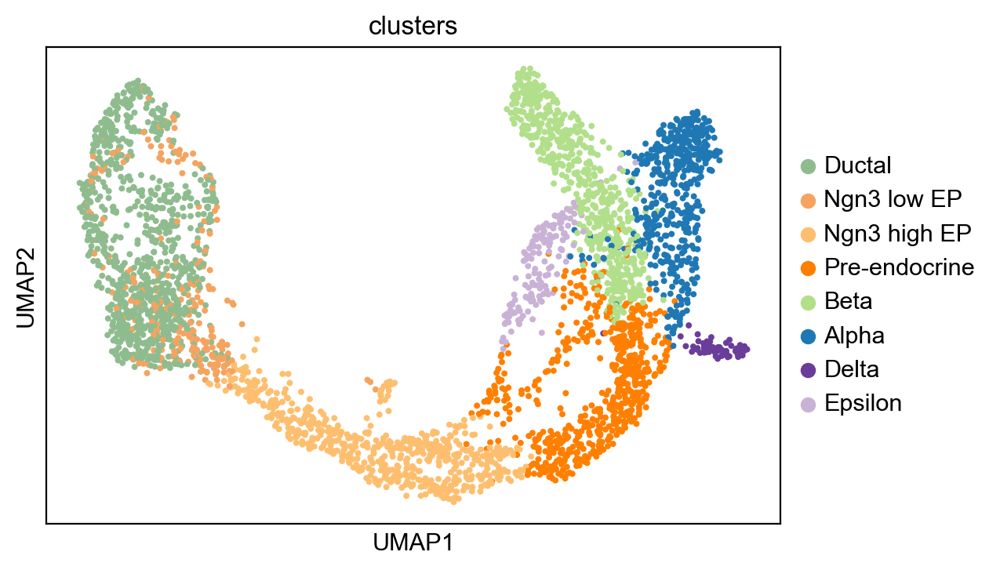

In [16]:
sc.pl.umap(adata, color="clusters")

#### Smoothing 

In [17]:
# scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000) <- this will do the same thing as lines above
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
adata

computing neighbors


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 3696 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'highly_variable_genes', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

#### Finally compute velocity

walk thru phase plot below

In [18]:
scv.tl.velocity(adata)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [19]:
adata

AnnData object with n_obs × n_vars = 3696 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'highly_variable_genes', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca', 'velocity_params'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

#### Transition matrix
- for embedding
- for velocity pt

In [20]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/8 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

/Users/patrickcahan/opt/anaconda3/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:21) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


#### Placing velocities onto embedding

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


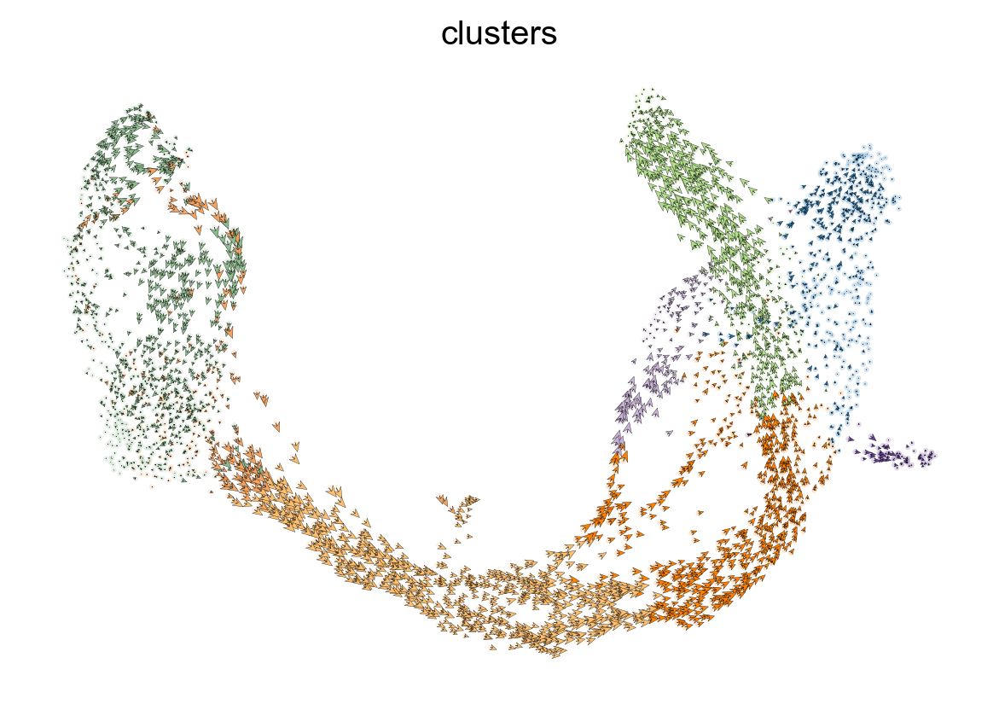

In [21]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120)

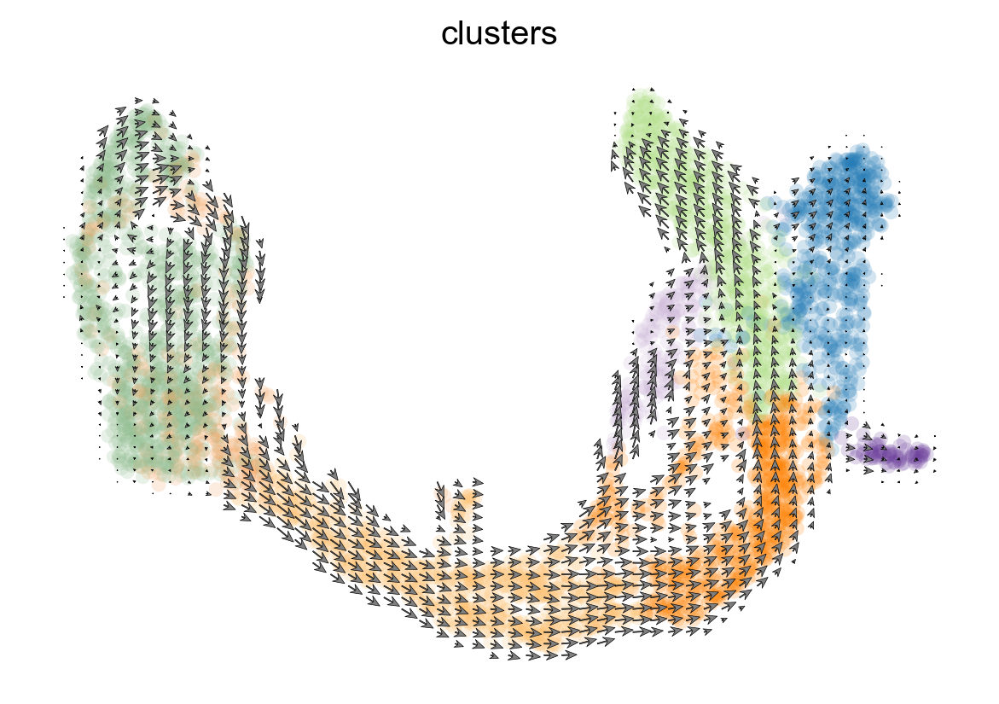

In [22]:
scv.pl.velocity_embedding_grid(adata, arrow_length=3, arrow_size=2, dpi=120)

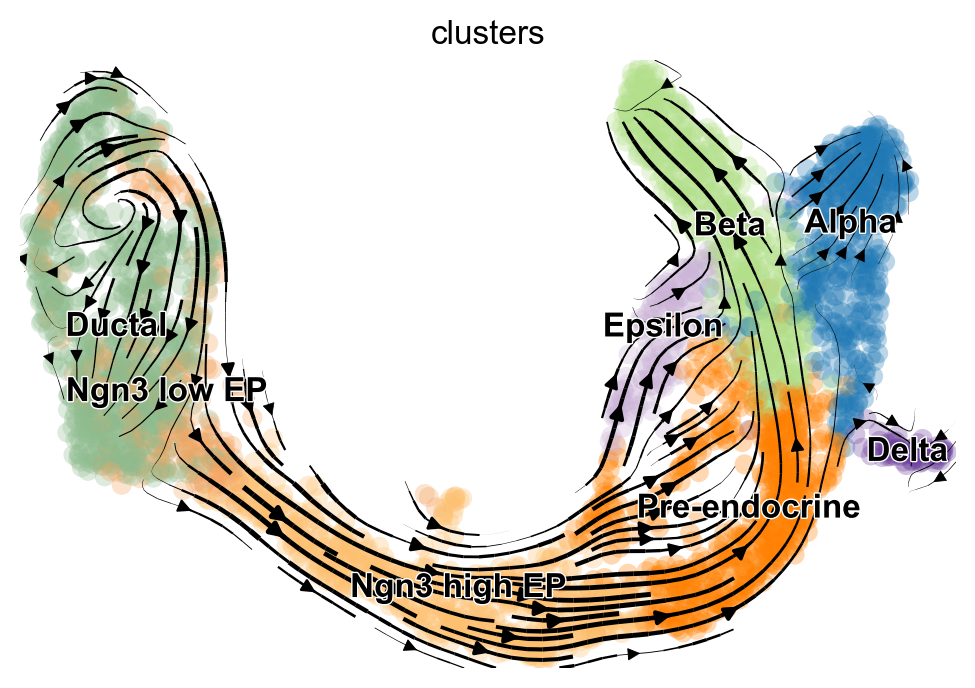

In [23]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

Still just an annData, so we can do the usual things

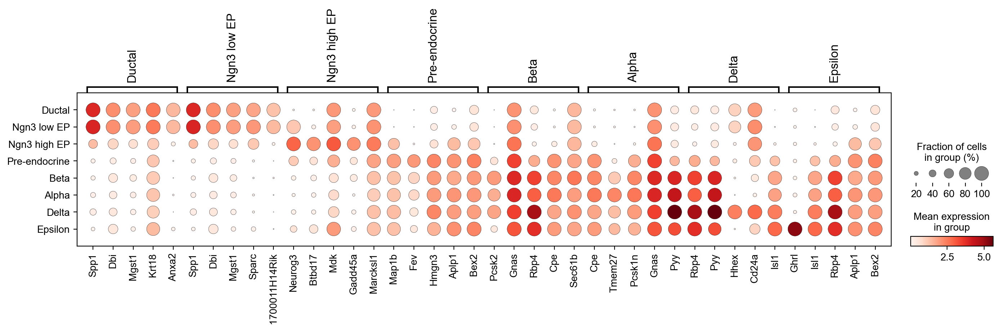

In [24]:
sc.tl.rank_genes_groups(adata,'clusters', use_raw=False)
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby='clusters', use_raw=False, dendrogram=False)

In [25]:
sc.pp.scale(adata, max_value=10)

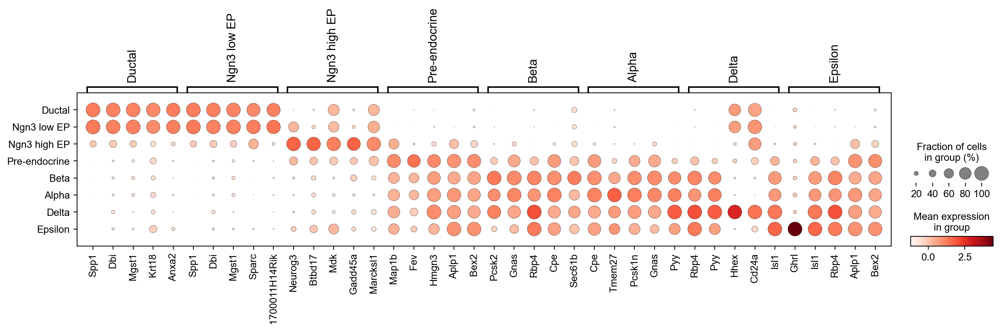

In [26]:
sc.tl.rank_genes_groups(adata,'clusters', use_raw=False)
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby='clusters', use_raw=False, dendrogram=False)

#### Velocities of known genes

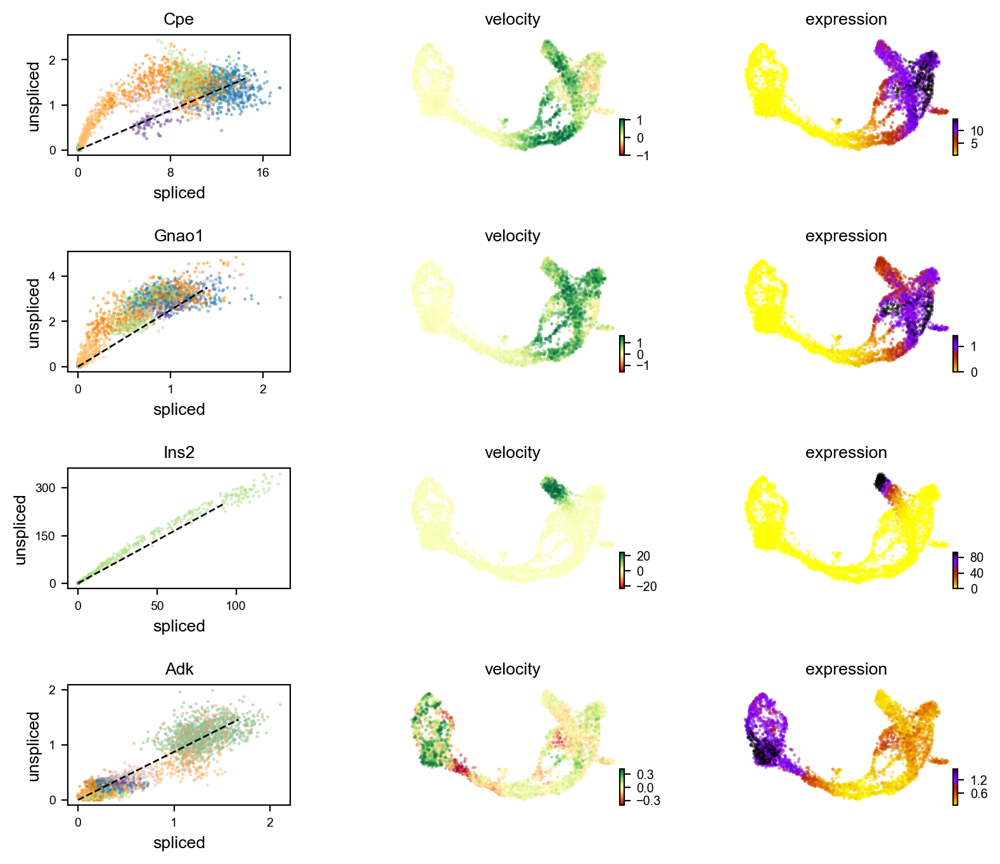

In [27]:
scv.pl.velocity(adata, ['Cpe',  'Gnao1', 'Ins2', 'Adk'], ncols=1)

#### Find genes whose velocities differ between clusters

In [28]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,2610035D17Rik,2610035D17Rik,Pde1c,Pam,Pax6,Zcchc16,Zdbf2,Heg1
1,Notch2,Hivep2,Ptprs,Sdk1,Unc5c,Nlgn1,Akr1c19,Tmcc3
2,Gm20649,Gm20649,Ttyh2,Abcc8,Nnat,Nell1,Spock3,Ica1
3,Sox5,Gulp1,Pclo,Baiap3,Tmem108,Chrm3,Ptprt,Ncoa7
4,Naaladl2,Echdc2,Grik2,Gnas,Ptprt,Prune2,Snap25,Ank2


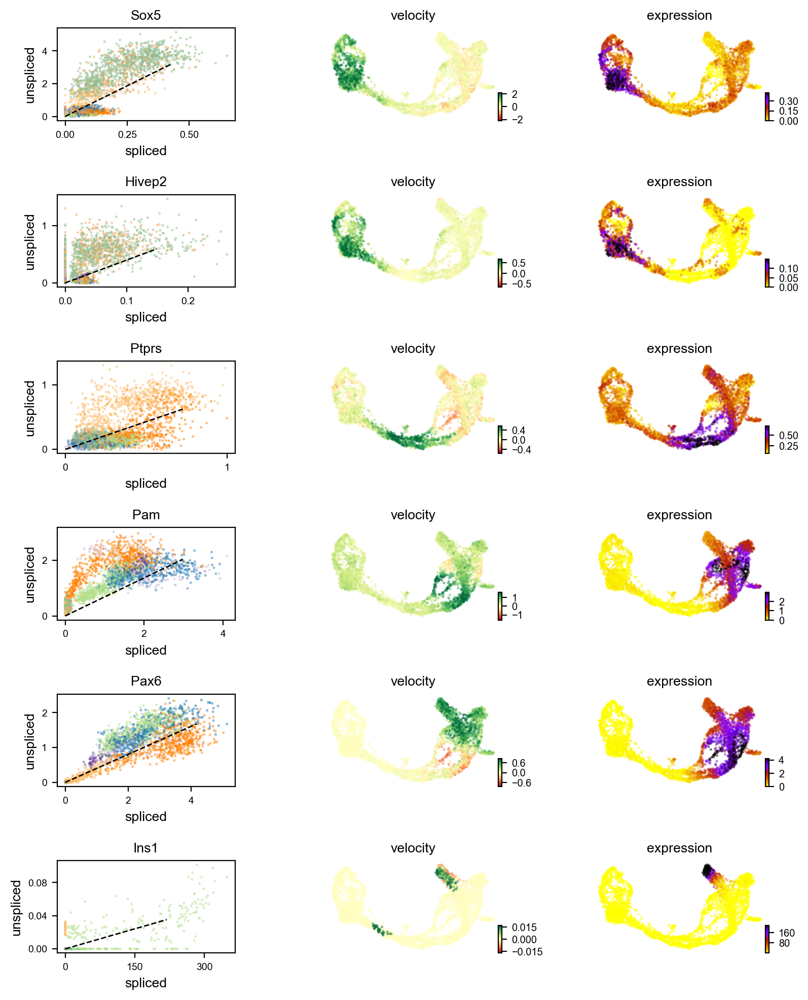

In [29]:
scv.pl.velocity(adata, ["Sox5", "Hivep2", "Ptprs", "Pam", "Pax6", "Ins1"], ncols=1)

Does Ins1 have introns? Show students Entrez Gene, and how to view the gene structure.

#### Cell cycle

What is the cycle in the ductal compartment???

In [30]:
scv.tl.score_genes_cell_cycle(adata)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


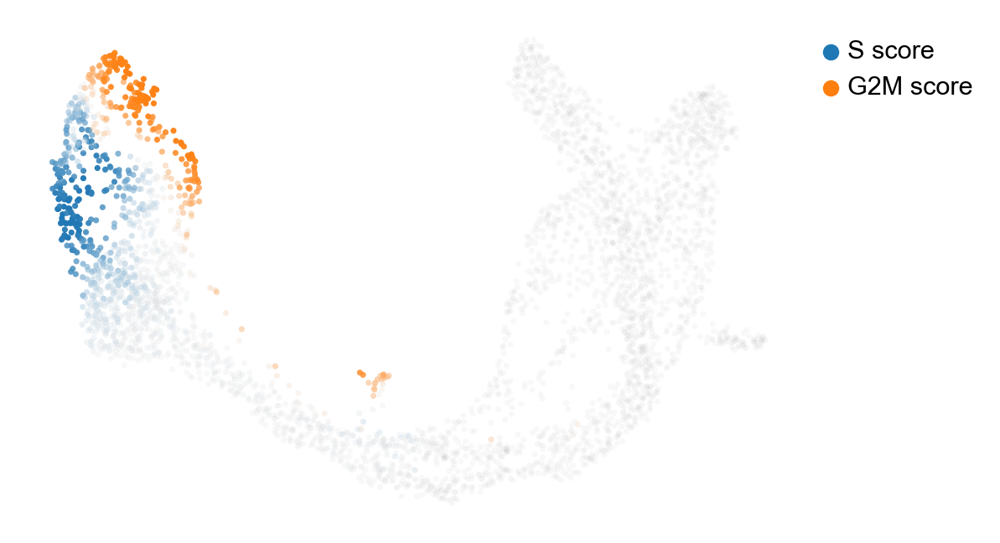

In [31]:
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

#### Magnitude and "confidence"
explain these metrics and what 'confidence' in this context really means

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


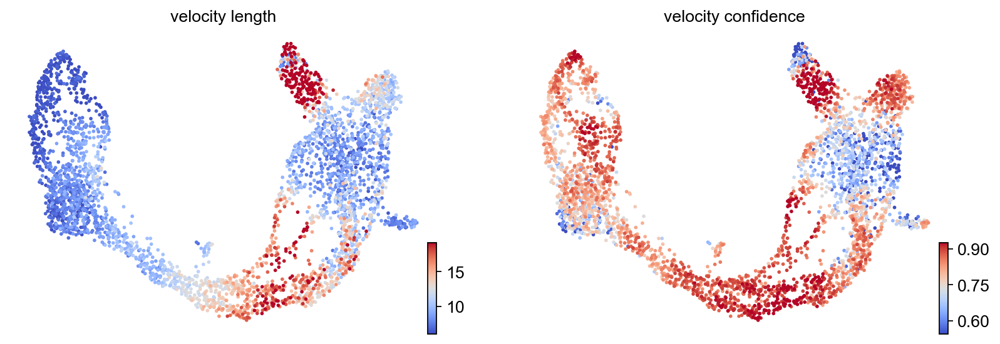

In [32]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

#### Cluster analysis of state transitions

In [33]:
df = adata.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

clusters,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
velocity_length,7.249028,7.729008,13.006619,12.847837,14.069593,9.907110,7.749000,10.523310
velocity_confidence,0.793872,0.770499,0.875152,0.805025,0.709603,0.727740,0.698432,0.782908


How are cells predicted to be related to each other? Look at transition matrix

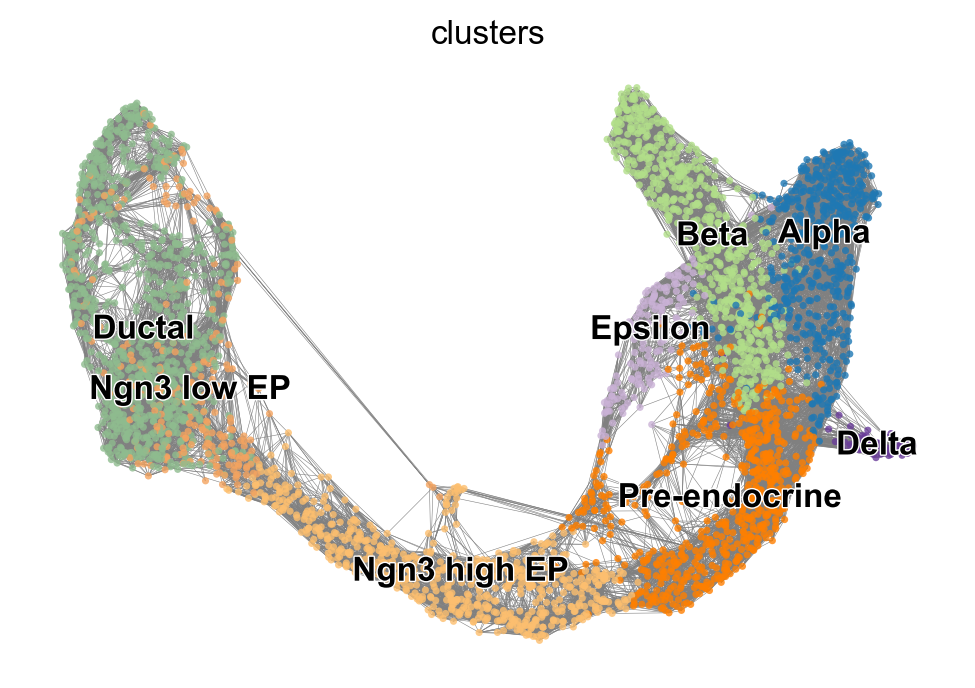

In [34]:
scv.pl.velocity_graph(adata, threshold=.1)

What is the ultimate fate of a given cell?

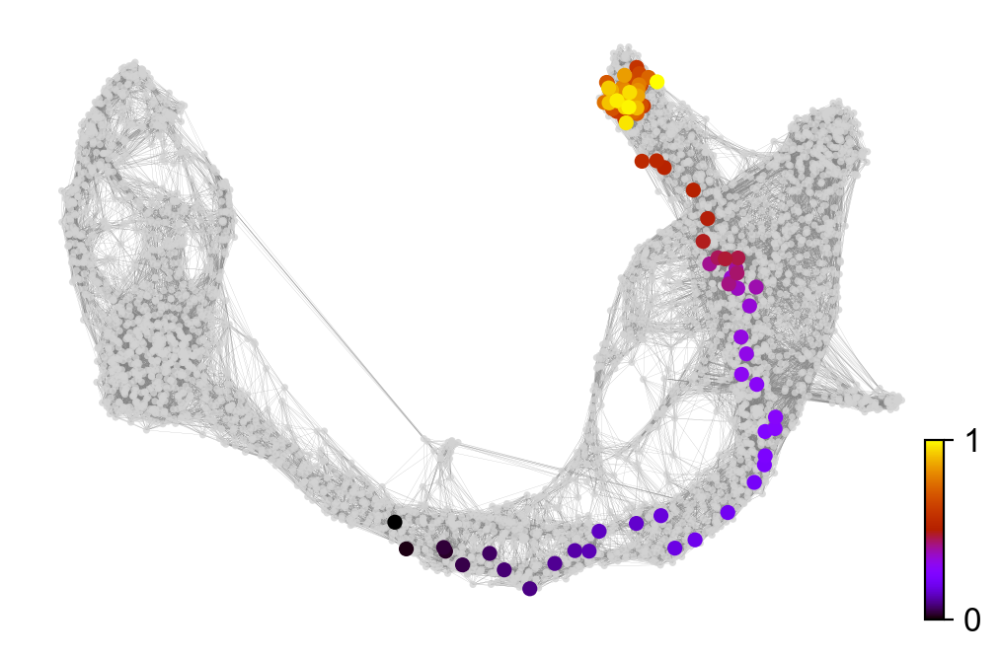

In [35]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [ ]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=1001)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

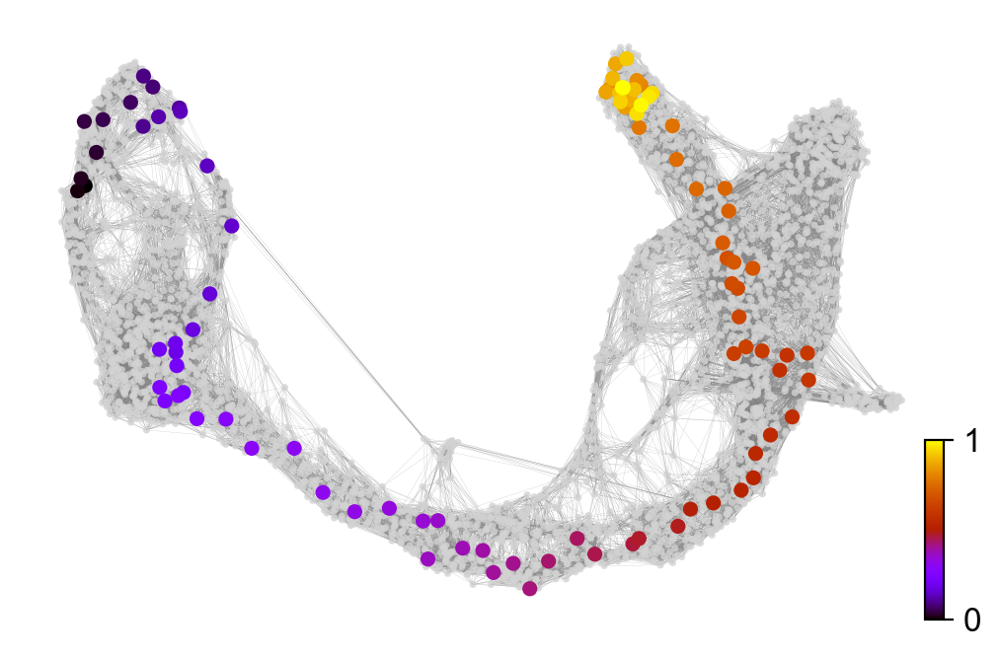

In [36]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=11)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

#### Velocity pseudotime

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


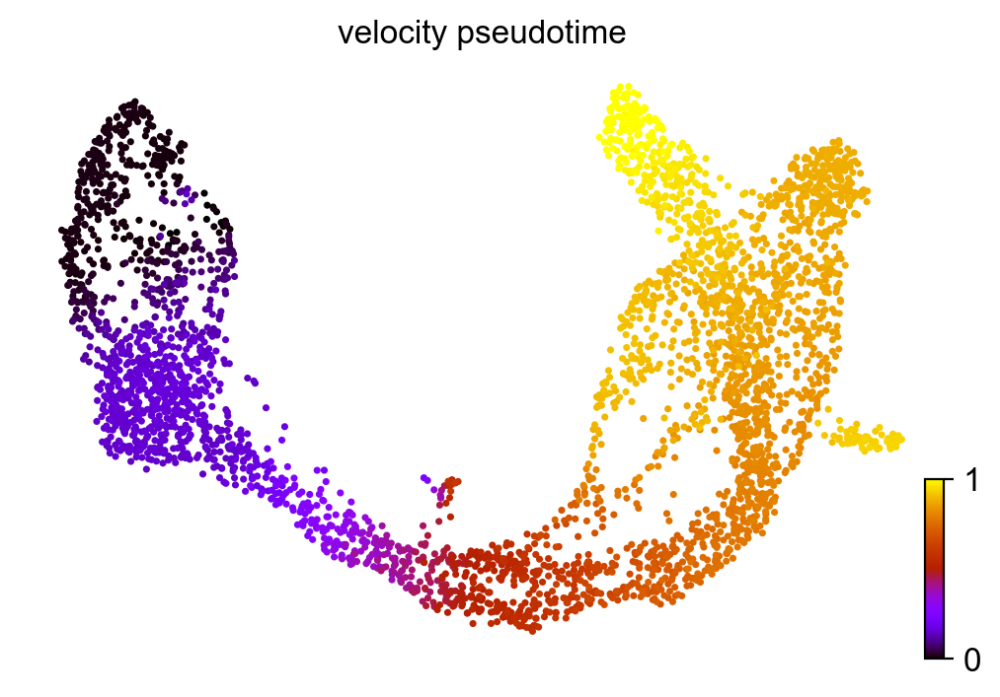

In [37]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')


Again, aggregate these transitions to a cluster level with PAGA

In [38]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='clusters')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
Ductal,0,0,0.024,0,0,0,0,0
Ngn3 low EP,0,0,0.24,0,0,0,0,0
Ngn3 high EP,0,0,0,0.23,0,0,0,0
Pre-endocrine,0,0,0,0,0.5,0.098,0.21,0.12
Beta,0,0,0,0,0,0,0,0
Alpha,0,0,0,0,0,0,0,0
Delta,0,0,0,0,0,0,0,0
Epsilon,0,0,0,0,0,0,0,0


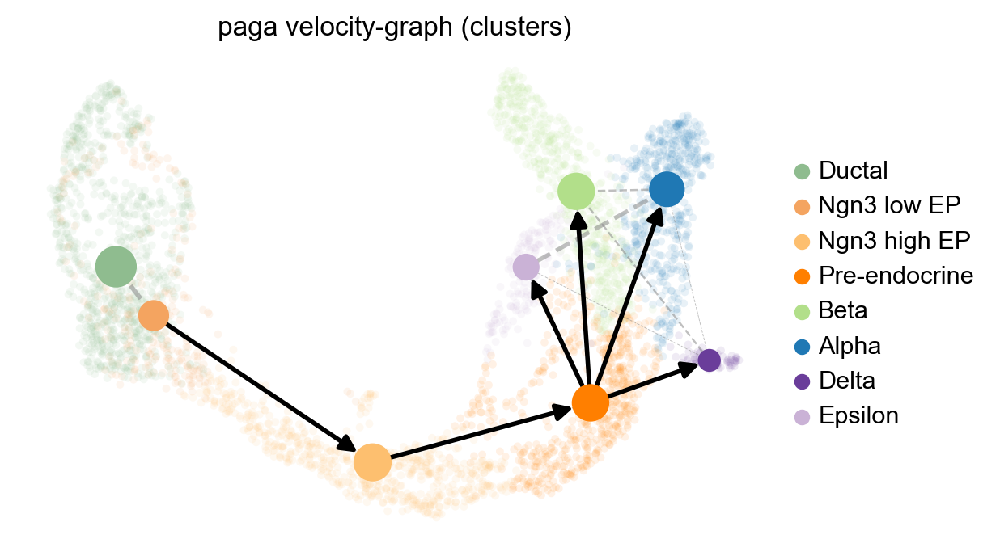

In [39]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)